In [38]:
import random
import numpy as np
import pandas as pd
from deap import base, creator, tools, algorithms
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

In [39]:
from sklearn.datasets import make_moons
import pandas as pd

# Gera os dados
X_array, y_array = make_moons(n_samples=300, noise=0.3, random_state=7)

X_T, X_test, y_T, y_test = train_test_split(X_array, y_array, random_state=42, test_size=0.2)
X_t = pd.DataFrame(X_test, columns=['feature1', 'feature2'])
y_t = pd.Series(y_test)

# Cria um DataFrame como se fosse o iris
df = pd.DataFrame(data=X_T, columns=['feature1', 'feature2'])
df['classes'] = y_T # variável de classe, mesmo nome que no iris

# Define X e y como no seu exemplo
y = df['classes'].copy()
X = df.iloc[:, :2].copy()  # Apenas duas colunas aqui

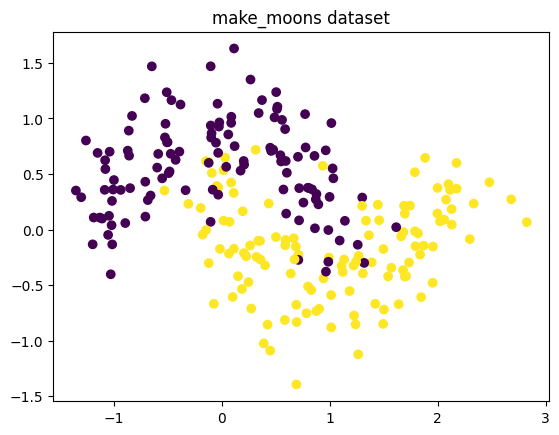

In [40]:
# Gráfico de dispersão
import matplotlib.pyplot as plt

plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, cmap='viridis')
plt.title("make_moons dataset")
plt.show()

In [41]:
from sklearn.tree import DecisionTreeClassifier
ClassificadorDT = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
            max_features=None, max_leaf_nodes=None, random_state=7, min_samples_leaf=2,
            splitter='best')
ClassificadorDT.fit(X, y)

,criterion,'gini'
,splitter,'best'
,max_depth,5
,min_samples_split,2
,min_samples_leaf,2
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,7
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


In [42]:
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore", message="X does not have valid feature names")

y_pred=ClassificadorDT.predict(X_t)
accuracy_score(y_pred, y_t)

0.8833333333333333

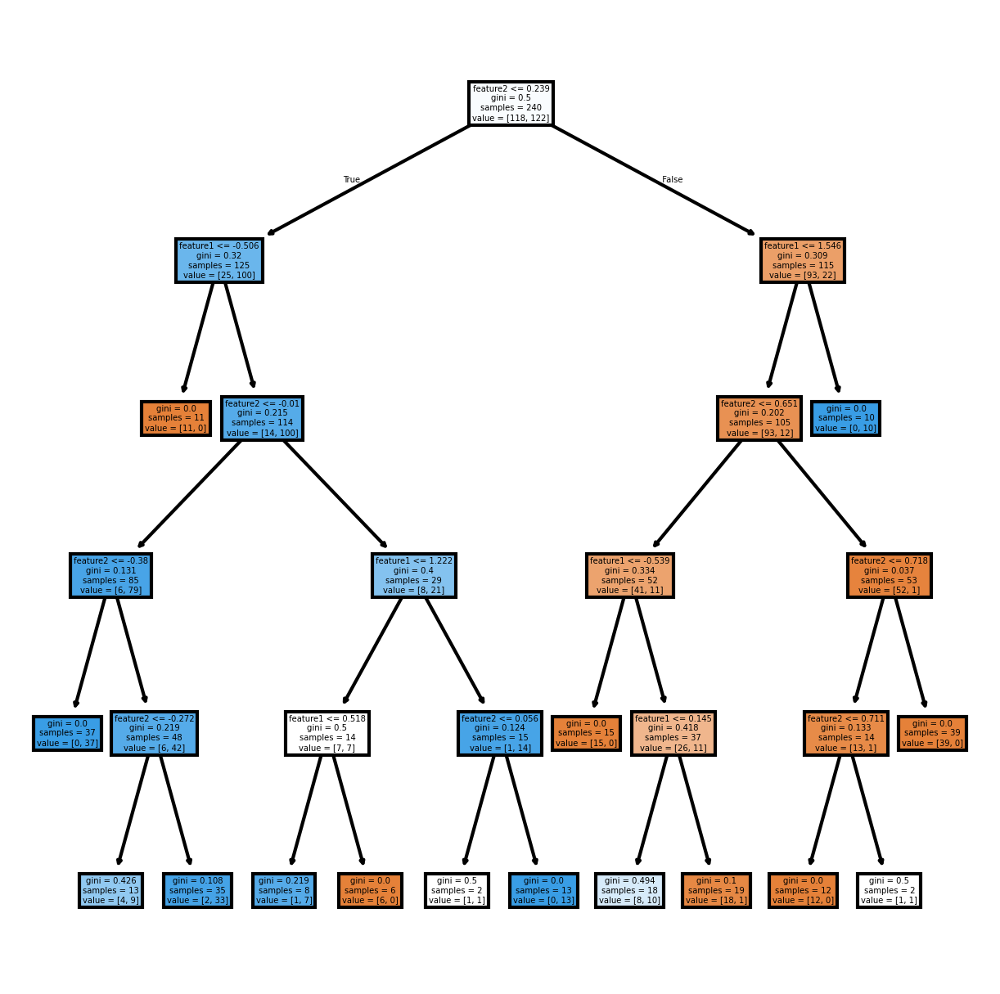

In [43]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Plotar a árvore de decisão
plt.figure(figsize=(5, 5), dpi=300)
plot_tree(ClassificadorDT, feature_names=X.columns, filled=True)
plt.show()

# Initial Population  

Generates 100 random individuals:  

Attribute: Random choice among the dataset columns (except the class).  

Operator: Randomly selected from ["<", ">", "<=", ">=", "=="].  

Threshold: Random value within the attribute’s range.  

Example of generation:  

In [44]:
def criar_individuo(atributos):
    """
    The idea is that we can better explore the space of possibilities and the possible splits of our dataset,
    rather than just using the mean.
    """
    atributo = random.choice(atributos)
    operador = random.choice(["<", ">", "<=", ">="])
    threshold = random.uniform(min(df[atributo]), max(df[atributo]))
    return {"premisse": (atributo, operador, threshold)}

# Creating the population
coluna_classe = "classes"
atributos = df.columns[df.columns != "classes"].tolist()
populacao = [criar_individuo(atributos) for _ in range(100)]
print(populacao)

[{'premisse': ('feature2', '<', -0.8527715518100909)}, {'premisse': ('feature1', '>=', -1.1275131950084576)}, {'premisse': ('feature2', '<', -1.3299004733089215)}, {'premisse': ('feature1', '<=', -0.2268872782400364)}, {'premisse': ('feature2', '>=', 0.4445756474051039)}, {'premisse': ('feature2', '<=', 0.48376312159813306)}, {'premisse': ('feature1', '>=', 2.7424704956238335)}, {'premisse': ('feature2', '<=', -0.3099765535555288)}, {'premisse': ('feature2', '>', 0.9735299729630256)}, {'premisse': ('feature1', '<', -0.7250513966994979)}, {'premisse': ('feature2', '<', -0.5149542383920681)}, {'premisse': ('feature2', '>', -1.0074268126183334)}, {'premisse': ('feature2', '>', -1.0650847242376327)}, {'premisse': ('feature1', '<', -1.2478496737537987)}, {'premisse': ('feature1', '>=', 2.790165297177958)}, {'premisse': ('feature1', '<=', 2.7680561157502845)}, {'premisse': ('feature1', '>=', 0.020513877263926616)}, {'premisse': ('feature1', '<', -0.3991541877700391)}, {'premisse': ('feature2

In [45]:
def aplicar_premissa(df, premissa):
    """
    This function applies the premises generated in the initial population, splitting the dataframe into two new groups: 
    df_true for those that satisfy the premise, and df_false for those that do not.  
    In this way, we can later calculate the majority error produced by the division of each premise and find the one that 
    best splits the data. These premises will still be evolved over generations by the GA, aiming to maximize their fitness.
    """
    
    atributo, operador, threshold = premissa["premisse"]
    
    if operador == "<":
        df_true = df[df[atributo] < threshold]
        df_false = df[df[atributo] >= threshold]
    elif operador == "<=":
        df_true = df[df[atributo] <= threshold]
        df_false = df[df[atributo] > threshold]
    elif operador == ">":
        df_true = df[df[atributo] > threshold]
        df_false = df[df[atributo] <= threshold]
    elif operador == ">=":
        df_true = df[df[atributo] >= threshold]
        df_false = df[df[atributo] < threshold]
    else:
        raise ValueError(f"Operador desconhecido: {operador}")
    
    return df_true, df_false

In [46]:
def erro_majoritario(df, coluna_classe="classes"):
    """Calculates the majority classification error (the lower, the better)."""
    if df.empty:
        return 0  # ou 1, dependendo da penalidade que quiser
    classe_majoritaria = df[coluna_classe].value_counts().idxmax()
    erro = sum(df[coluna_classe] != classe_majoritaria)/len(df)
    return erro

In [47]:
def evaluate(df, populacao, coluna_classe="classes"):
    """
    This function uses aplicar_premissa to generate df_true and df_false, and calculates the majority error in both, 
    weighted by the size of the subsets relative to the original dataframe. 
    In other words, it checks whether the premise splits the data into representative subsets.
    """
    resultados = []
    for individuo in populacao:
        df_verdadeiro, df_falso = aplicar_premissa(df, individuo)
        
        # Calcula o erro majoritário em cada subconjunto
        erro_true = erro_majoritario(df_verdadeiro, coluna_classe) 
        erro_false = erro_majoritario(df_falso, coluna_classe) 
        
        # Peso proporcional ao tamanho dos conjuntos
        peso_true = len(df_verdadeiro)/len(df) if len(df) > 0 else 0
        peso_false = len(df_falso)/len(df) if len(df) > 0 else 0

        # Fitness é o erro ponderado (quanto menor, melhor)
        fitness = peso_true * erro_true + peso_false * erro_false
        
        resultados.append((individuo, fitness))
    
    return resultados

In [48]:
avaliacoes = evaluate(df, populacao, coluna_classe="classes")
print(avaliacoes)
avaliacoes_ordenadas = sorted(avaliacoes, key=lambda x: x[1])
print('\nMelhores Indivíduos:')
for ind, fit in avaliacoes_ordenadas[:5]:
    print(ind, "-> fitness:", fit)

[({'premisse': ('feature2', '<', -0.8527715518100909)}, 0.48333333333333334), ({'premisse': ('feature1', '>=', -1.1275131950084576)}, 0.4666666666666667), ({'premisse': ('feature2', '<', -1.3299004733089215)}, 0.4916666666666667), ({'premisse': ('feature1', '<=', -0.2268872782400364)}, 0.29583333333333334), ({'premisse': ('feature2', '>=', 0.4445756474051039)}, 0.24166666666666664), ({'premisse': ('feature2', '<=', 0.48376312159813306)}, 0.2541666666666667), ({'premisse': ('feature1', '>=', 2.7424704956238335)}, 0.4916666666666667), ({'premisse': ('feature2', '<=', -0.3099765535555288)}, 0.3416666666666667), ({'premisse': ('feature2', '>', 0.9735299729630256)}, 0.4125), ({'premisse': ('feature1', '<', -0.7250513966994979)}, 0.37916666666666665), ({'premisse': ('feature2', '<', -0.5149542383920681)}, 0.4), ({'premisse': ('feature2', '>', -1.0074268126183334)}, 0.49166666666666664), ({'premisse': ('feature2', '>', -1.0650847242376327)}, 0.4916666666666667), ({'premisse': ('feature1', '<'

In [49]:
def torneio(pop_avaliada, k=3):
    """Selects the best individual among k random individuals."""
    competidores = random.sample(pop_avaliada, k)
    vencedor = min(competidores, key=lambda x: x[1])  # menor fitness
    return vencedor[0]  # retorna apenas o indivíduo (sem o fitness)

In [50]:
def crossover_rnd(pai1, pai2):

    atributo = pai1["premisse"][0] if random.random() < 0.5 else pai2["premisse"][0]
    operador = pai1["premisse"][1] if random.random() < 0.5 else pai2["premisse"][1]
    threshold = pai1["premisse"][2] if random.random() < 0.5 else pai2["premisse"][2]
    
    premissa_filho = (atributo, operador, threshold)
    
    return {"premisse": premissa_filho}

In [51]:
def mutacao(individuo, atributos, intervalo_atributos, prob_mut_attr=0.1, prob_mut_op=0.1, prob_mut_val=0.2):
    
    premissa = individuo['premisse']  
    nova_premissa = list(premissa)  

    
    if random.random() < prob_mut_attr:
        nova_premissa[0] = random.choice(atributos)
        min_val, max_val = intervalo_atributos[nova_premissa[0]]
        nova_premissa[2] = random.uniform(min_val, max_val)

    
    if random.random() < prob_mut_op:
        operadores = ['<', '<=', '>', '>=']
        nova_premissa[1] = random.choice(operadores)

    
    if random.random() < prob_mut_val:
        attr = nova_premissa[0]
        min_val, max_val = intervalo_atributos[attr]
        nova_premissa[2] = random.uniform(min_val, max_val)

    return {'premisse': tuple(nova_premissa)} 

In [52]:
def calcular_intervalo_atributos(df, atributos):
    intervalo = {}
    for atributo in atributos:
        min_val = df[atributo].min()
        max_val = df[atributo].max()
        intervalo[atributo] = (min_val, max_val)
    return intervalo

In [53]:
def nova_geracao(
    pop_avaliada, 
    atributos, 
    intervalo_atributos, 
    tamanho=100, 
    prob_mut_attr=0.1, 
    prob_mut_op=0.1, 
    prob_mut_val=0.2
):

    print('\nPopulação Avaliada', pop_avaliada)
    elite = min(pop_avaliada, key=lambda x: x[1])[0]  
    
    nova_populacao = [elite]  
    
    while len(nova_populacao) < tamanho:
        
        pai1 = torneio(pop_avaliada)
        pai2 = torneio(pop_avaliada)
        
        
        filho = crossover_rnd(pai1, pai2)
        print('\n Offspring', filho)
        
        
        filho_mutado = mutacao(
            filho,
            atributos,
            intervalo_atributos,
            prob_mut_attr=prob_mut_attr,
            prob_mut_op=prob_mut_op,
            prob_mut_val=prob_mut_val
        )
        
        nova_populacao.append(filho_mutado)
    
    return nova_populacao

In [54]:
# Main test
n_geracoes = 10
tamanho_pop = 200
taxa_mutacao = 0.2

atributos = df.columns[df.columns != "classes"].tolist()

intervalo_atributos = calcular_intervalo_atributos(df, atributos)


for gen in range(n_geracoes):
    print(f"\n=== Generation {gen + 1} ===")
    

    avaliacoes = evaluate(df, populacao, coluna_classe="classes")


    melhor_ind, melhor_fit = min(avaliacoes, key=lambda x: x[1])
    print(f"Best Individual: {melhor_ind} -> Fitness: {melhor_fit:.4f}")


    populacao = nova_geracao(
        avaliacoes, 
        atributos, 
        intervalo_atributos, 
        tamanho=tamanho_pop, 
        prob_mut_attr=0.3, 
        prob_mut_op=0.5, 
        prob_mut_val=0.3
    )
    print('\nPopulation:', populacao)


=== Generation 1 ===
Best Individual: {'premisse': ('feature2', '<=', 0.24023962700750867)} -> Fitness: 0.1958

População Avaliada [({'premisse': ('feature2', '<', -0.8527715518100909)}, 0.48333333333333334), ({'premisse': ('feature1', '>=', -1.1275131950084576)}, 0.4666666666666667), ({'premisse': ('feature2', '<', -1.3299004733089215)}, 0.4916666666666667), ({'premisse': ('feature1', '<=', -0.2268872782400364)}, 0.29583333333333334), ({'premisse': ('feature2', '>=', 0.4445756474051039)}, 0.24166666666666664), ({'premisse': ('feature2', '<=', 0.48376312159813306)}, 0.2541666666666667), ({'premisse': ('feature1', '>=', 2.7424704956238335)}, 0.4916666666666667), ({'premisse': ('feature2', '<=', -0.3099765535555288)}, 0.3416666666666667), ({'premisse': ('feature2', '>', 0.9735299729630256)}, 0.4125), ({'premisse': ('feature1', '<', -0.7250513966994979)}, 0.37916666666666665), ({'premisse': ('feature2', '<', -0.5149542383920681)}, 0.4), ({'premisse': ('feature2', '>', -1.0074268126183334

In [55]:
print(melhor_ind)
melhor_individuo = melhor_ind
df_esquerda, df_direita = aplicar_premissa(df, melhor_individuo)

{'premisse': ('feature2', '<=', 0.24023962700750867)}


In [56]:
def evoluir_solucoes(df, 
                      atributos, 
                      intervalo_atributos, 
                      profundidade=0, 
                      max_profundidade=5, 
                      n_geracoes=10, 
                      tamanho_pop=100, 
                      taxa_mutacao=0.2, 
                      coluna_classe="classes",
                      min_samples=2):
    """
    Evolves data-splitting solutions in a decision tree using a genetic algorithm.
    Returns class counts instead of DataFrames.
    """
    # Initialize the population
    populacao = [criar_individuo(atributos) for _ in range(tamanho_pop)]
    
    # Stopping criterion
    if profundidade >= max_profundidade or len(df) < min_samples:
        return {
            "folha": True,
            "classes": df[coluna_classe].value_counts().to_dict()
        }

    # Evaluation over generations
    for gen in range(n_geracoes):
        avaliacoes = evaluate(df, populacao, coluna_classe)
        melhor_ind, melhor_fit = min(avaliacoes, key=lambda x: x[1])
        populacao = nova_geracao(
            avaliacoes, 
            atributos, 
            intervalo_atributos, 
            tamanho=tamanho_pop, 
            prob_mut_attr=0.1, 
            prob_mut_op=0.1, 
            prob_mut_val=taxa_mutacao
        )

    # Select the best premise and apply it
    melhor_individuo = melhor_ind
    premissa = melhor_individuo  # now the premise is defined
    df_esquerda, df_direita = aplicar_premissa(df, melhor_individuo)
    
    if len(df_esquerda) == 0 or len(df_direita) == 0:
        return {
            "folha": True,
            "classes": df[coluna_classe].value_counts().to_dict()
        }
    
    # Check the majority error for the subsets
    erro_esquerda = erro_majoritario(df_esquerda, coluna_classe)
    erro_direita = erro_majoritario(df_direita, coluna_classe)

    # Evolve or stop for each branch separately
    if erro_esquerda < erro_threshold:
        no_esquerdo = {
            "folha": True,
            "classes": df_esquerda[coluna_classe].value_counts().to_dict()
        }
    else:
        no_esquerdo = evoluir_solucoes(
            df_esquerda, atributos, intervalo_atributos,
            profundidade + 1, max_profundidade, n_geracoes,
            tamanho_pop, taxa_mutacao, coluna_classe
        )

    if erro_direita < erro_threshold:
        no_direito = {
            "folha": True,
            "classes": df_direita[coluna_classe].value_counts().to_dict()
        }
    else:
        no_direito = evoluir_solucoes(
            df_direita, atributos, intervalo_atributos,
            profundidade + 1, max_profundidade, n_geracoes,
            tamanho_pop, taxa_mutacao, coluna_classe
        )

    return {
        "folha": False,
        "premissa": premissa,
        "contagem_total": df[coluna_classe].value_counts().to_dict(),
        "contagem_esquerda": df_esquerda[coluna_classe].value_counts().to_dict(),
        "contagem_direita": df_direita[coluna_classe].value_counts().to_dict(),
        "esquerda": no_esquerdo,
        "direita": no_direito
    }


In [57]:
import matplotlib.pyplot as plt
import warnings

def plot_tree_custom(node, x=0, y=0, dx=3.0, dy=1.0, ax=None, depth=0, pos_dict=None, parent_pos=None):
    """
    Draws the decision tree with improved spacing to avoid overlap.
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(35, 30), dpi=350)
    
        ax.axis("off")
        pos_dict = {"max_y": 0, "min_y": 0, "depth_max": get_tree_depth(node)}
        plot_tree_custom(node, x, y, dx, dy, ax, depth, pos_dict)
        plt.tight_layout()
        plt.savefig("tree_custom.png", bbox_inches="tight")
        warnings.filterwarnings("ignore", category=UserWarning)
        plt.show()
        return

    # Dynamic adjustment based on the total depth
    spacing_factor = pos_dict["depth_max"] - depth + 1
    current_dx = dx * spacing_factor
    current_dy = dy * spacing_factor * 0.5  # increases vertical spacing
    
    # Leaf node
    if node.get("folha", False):
        classes = node.get("classes", {})
        total = sum(classes.values())

        text = "Leaf\n"
        text += f"Total: {total}\n"
        text += "Classes:\n"
        for cls, count in sorted(classes.items()):
            text += f"  {cls}: {count} ({count/total:.1%})\n"

        ax.text(x, y, text,
                bbox=dict(facecolor="#c1f0c1", alpha=1.0, edgecolor="darkgreen", boxstyle="round,pad=0.5"),
                ha="center", va="center", fontsize=10)

        if parent_pos:
            ax.plot([parent_pos[0], x], [parent_pos[1], y],
                    color="#555555", linestyle="-", linewidth=1.5, alpha=1.0)

        pos_dict["max_y"] = max(pos_dict["max_y"], y)
        pos_dict["min_y"] = min(pos_dict["min_y"], y)
        return y

    # Internal node
    premissa = node.get("premissa", {}).get("premisse", ("?", "?", "?"))
    total_counts = node.get("contagem_total", {})
    left_counts = node.get("contagem_esquerda", {})
    right_counts = node.get("contagem_direita", {})
    total = sum(total_counts.values())

    text = f"{premissa[0]}\n{premissa[1]} {premissa[2]:.2f}\n"
    text += f"Total: {total}\n"
    text += "Distribution:\n"
    for cls, count in sorted(total_counts.items()):
        text += f"  {cls}: {count} ({count/total:.1%})\n"

    ax.text(x, y, text,
            bbox=dict(facecolor="#b0e0e6", alpha=1.0, edgecolor="darkblue", boxstyle="round,pad=0.5"),
            ha="center", va="center", fontsize=10)

    if parent_pos:
        ax.plot([parent_pos[0], x], [parent_pos[1], y],
                color="#555555", linestyle="-", linewidth=1.5, alpha=1.0)

    # Child coordinates
    left_y = y - current_dy
    right_y = y + current_dy

    left_child_y = plot_tree_custom(node["esquerda"], x + current_dx, left_y,
                                    dx, dy, ax, depth + 1, pos_dict, parent_pos=(x, y))
    left_text = "True\n"
    ax.text(x + current_dx / 3, (y + left_child_y) / 2, left_text,
            ha="right", va="center", fontsize=15, color="#1f77b4",
           )

    right_child_y = plot_tree_custom(node["direita"], x + current_dx, right_y,
                                     dx, dy, ax, depth + 1, pos_dict, parent_pos=(x, y))
    right_text = "False\n"
    ax.text(x + current_dx / 3, (y + right_child_y) / 2, right_text,
            ha="left", va="center", fontsize=15, color="#d62728",
            )

    return y


def get_tree_depth(node):
    """Calculates the maximum depth of the tree."""
    if node.get("folha", False):
        return 0
    return 1 + max(get_tree_depth(node["esquerda"]), get_tree_depth(node["direita"]))

In [58]:
n_geracoes = 15
tamanho_pop = 250
taxa_mutacao = 0.5
erro_threshold = 0.05
max_profundidade=20
atributos = df.columns[df.columns != "classes"].tolist()
intervalo_atributos = calcular_intervalo_atributos(df, atributos)

arvore = evoluir_solucoes(df, 
                           atributos, 
                           intervalo_atributos, 
                           n_geracoes=n_geracoes, 
                           tamanho_pop=tamanho_pop, 
                           taxa_mutacao=taxa_mutacao,
                           max_profundidade=max_profundidade,
                           coluna_classe="classes")

print(arvore)


População Avaliada [({'premisse': ('feature2', '<=', -1.0601895336719185)}, 0.4916666666666667), ({'premisse': ('feature2', '>', -0.9471465414214582)}, 0.49166666666666664), ({'premisse': ('feature2', '>=', -0.7821412837193926)}, 0.46666666666666673), ({'premisse': ('feature2', '>', -1.097773254717216)}, 0.4916666666666667), ({'premisse': ('feature2', '<=', 1.1379329512197154)}, 0.45416666666666666), ({'premisse': ('feature2', '>=', -1.2761457965312617)}, 0.4916666666666667), ({'premisse': ('feature1', '<=', -0.2639463733378571)}, 0.29583333333333334), ({'premisse': ('feature2', '>', 0.11111611988337367)}, 0.22916666666666663), ({'premisse': ('feature1', '<', -0.9631238987235413)}, 0.4083333333333333), ({'premisse': ('feature1', '<', 1.672468983361373)}, 0.36666666666666664), ({'premisse': ('feature2', '>=', 0.1318092494782941)}, 0.2375), ({'premisse': ('feature2', '<', -0.07610856116776366)}, 0.24583333333333332), ({'premisse': ('feature1', '<', 2.559746124323733)}, 0.491666666666666

In [59]:
plot_tree_custom(arvore)

## Comparison with the DT generated by SciKit-Learn

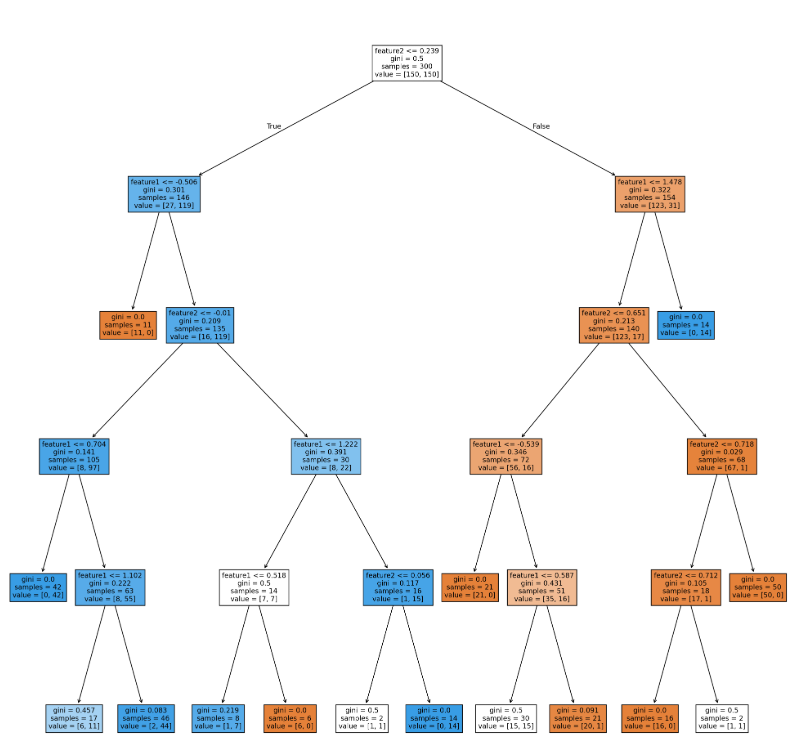

In [60]:
def predict_custom_tree(tree, X):
    """
    Faz predições com uma árvore de decisão evoluída baseada em dicionários com estrutura customizada.
    """
    def predizer_linha(no, linha):
        if no["folha"]:
            # Retorna a classe com maior frequência
            return max(no["classes"].items(), key=lambda x: x[1])[0]
        
        atributo, operador, valor = no["premissa"]["premisse"]
        entrada = linha[atributo]

        # Aplica operador
        if operador == "<":
            if entrada < valor:
                return predizer_linha(no["esquerda"], linha)
            else:
                return predizer_linha(no["direita"], linha)
        elif operador == "<=":
            if entrada <= valor:
                return predizer_linha(no["esquerda"], linha)
            else:
                return predizer_linha(no["direita"], linha)
        elif operador == ">":
            if entrada > valor:
                return predizer_linha(no["esquerda"], linha)
            else:
                return predizer_linha(no["direita"], linha)
        elif operador == ">=":
            if entrada >= valor:
                return predizer_linha(no["esquerda"], linha)
            else:
                return predizer_linha(no["direita"], linha)
        else:
            raise ValueError(f"Operador desconhecido: {operador}")
    
    # Aplica para todas as linhas
    return [predizer_linha(tree, linha) for _, linha in X.iterrows()]


In [61]:
y_pred_GAbDT = predict_custom_tree(arvore, X_t)
print(y_pred_GAbDT)
print("Acuracy GAbDT:", accuracy_score(y_t, y_pred_GAbDT))

[0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1]
Acuracy GAbDT: 0.8666666666666667


In [62]:
print(y_pred)
print("Acuracy sklearn:", accuracy_score(y_t, y_pred))

[0 0 1 1 0 0 0 0 0 1 0 1 0 1 1 0 1 0 0 0 1 1 1 1 1 1 0 1 0 0 0 1 0 0 0 0 1
 0 0 1 0 0 1 0 0 1 0 0 1 1 1 1 0 1 0 1 1 0 0 1]
Acuracy sklearn: 0.8833333333333333
